In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

plt.style.use('ggplot')
import seaborn as sns

## matplotlib 그래프에서 한글 깨짐 해결
import matplotlib
from matplotlib import font_manager, rc
import platform

if platform.system() == 'Windows':
# 윈도우인 경우
    font_name = font_manager.FontProperties(fname="c:/Windows/Fonts/malgun.ttf").get_name()
    rc('font', family=font_name)
else:    
# Mac 인 경우
    rc('font', family='AppleGothic')
    
matplotlib.rcParams['axes.unicode_minus'] = False 

In [11]:
## 제공 데이터 불러오기
df = pd.read_excel('/Users/andrew/hongsu/data/01_제공데이터/2021 빅콘테스트_데이터분석분야_퓨처스리그_홍수ZERO_댐유입량,강우,수위데이터_210803.xlsx', header=[0,1])[:2891]  # 이후부터는 유입량이 없는 데이터
df.columns = ['_'.join(col).strip() if "Unnamed" not in col[1] else col[0] for col in df.columns.values]

In [12]:
## 제공 데이터 사이즈
df.shape

(2891, 48)

In [14]:
display(df.head())
display(df.tail())

,홍수사상번호,연,월,일,시간,유입량,데이터집단 1_유역평균강수,데이터집단 1_강우(A지역),데이터집단 1_강우(B지역),데이터집단 1_강우(C지역),...,데이터 집단 5_강우(D지역),데이터 집단 5_수위(E지역),데이터 집단 5_수위(D지역),데이터 집단 6_유역평균강수,데이터 집단 6_강우(A지역),데이터 집단 6_강우(B지역),데이터 집단 6_강우(C지역),데이터 집단 6_강우(D지역),데이터 집단 6_수위(E지역),데이터 집단 6_수위(D지역)
0,1,2006,7,10,8,189.100000,6.4,7,7,7,...,8,2.54,122.660,6.4,7,7,8,8,2.54,122.610
1,1,2006,7,10,9,216.951962,6.3,7,8,7,...,10,2.53,122.648,7.3,7,8,10,10,2.53,122.600
2,1,2006,7,10,10,251.424419,6.4,7,9,7,...,11,2.53,122.636,8.2,7,9,10,11,2.53,122.590
3,1,2006,7,10,11,302.812199,7.3,7,10,7,...,14,2.53,122.620,11.3,9,10,15,14,2.53,122.585
4,1,2006,7,10,12,384.783406,8.2,7,12,8,...,16,2.53,122.604,14.4,12,12,18,16,2.53,122.575


,홍수사상번호,연,월,일,시간,유입량,데이터집단 1_유역평균강수,데이터집단 1_강우(A지역),데이터집단 1_강우(B지역),데이터집단 1_강우(C지역),...,데이터 집단 5_강우(D지역),데이터 집단 5_수위(E지역),데이터 집단 5_수위(D지역),데이터 집단 6_유역평균강수,데이터 집단 6_강우(A지역),데이터 집단 6_강우(B지역),데이터 집단 6_강우(C지역),데이터 집단 6_강우(D지역),데이터 집단 6_수위(E지역),데이터 집단 6_수위(D지역)
2886,25,2017,7,18,18,513.368437,22.7836,6,0,1,...,1,3.03,137.088,1.7366,6,0,1,1,3.03,137.130
2887,25,2017,7,18,19,502.846843,8.2586,2,0,1,...,1,3.00,137.104,1.7366,2,0,1,1,3.00,137.145
2888,25,2017,7,18,20,491.954805,4.1089,1,0,1,...,1,2.98,137.120,1.7366,1,0,1,1,2.98,137.155
2889,25,2017,7,18,21,481.103083,3.3854,1,0,1,...,1,2.96,137.136,1.7366,1,0,1,1,2.96,137.165
2890,25,2017,7,18,22,470.458109,3.2841,1,0,1,...,1,2.94,137.152,1.7366,1,0,1,1,2.94,137.180


<br>
<br>

In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2891 entries, 0 to 2890
Data columns (total 48 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   홍수사상번호            2891 non-null   int64  
 1   연                 2891 non-null   int64  
 2   월                 2891 non-null   int64  
 3   일                 2891 non-null   int64  
 4   시간                2891 non-null   int64  
 5   유입량               2891 non-null   float64
 6   데이터집단 1_유역평균강수    2891 non-null   float64
 7   데이터집단 1_강우(A지역)   2891 non-null   int64  
 8   데이터집단 1_강우(B지역)   2891 non-null   int64  
 9   데이터집단 1_강우(C지역)   2891 non-null   int64  
 10  데이터집단 1_강우(D지역)   2891 non-null   int64  
 11  데이터집단 1_수위(E지역)   2891 non-null   float64
 12  데이터집단 1_수위(D지역)   2891 non-null   float64
 13  데이터집단 2_유역평균강수    2891 non-null   float64
 14  데이터집단 2_강우(A지역)   2891 non-null   int64  
 15  데이터집단 2_강우(B지역)   2891 non-null   int64  
 16  데이터집단 2_강우(C지역)   2891 non-null   int64  


In [16]:
## 결측치 확인 (결측치 없음)
df.isnull().sum() / len(df) * 100

홍수사상번호              0.0
연                   0.0
월                   0.0
일                   0.0
시간                  0.0
유입량                 0.0
데이터집단 1_유역평균강수      0.0
데이터집단 1_강우(A지역)     0.0
데이터집단 1_강우(B지역)     0.0
데이터집단 1_강우(C지역)     0.0
데이터집단 1_강우(D지역)     0.0
데이터집단 1_수위(E지역)     0.0
데이터집단 1_수위(D지역)     0.0
데이터집단 2_유역평균강수      0.0
데이터집단 2_강우(A지역)     0.0
데이터집단 2_강우(B지역)     0.0
데이터집단 2_강우(C지역)     0.0
데이터집단 2_강우(D지역)     0.0
데이터집단 2_수위(E지역)     0.0
데이터집단 2_수위(D지역)     0.0
데이터집단 3_유역평균강수      0.0
데이터집단 3_강우(A지역)     0.0
데이터집단 3_강우(B지역)     0.0
데이터집단 3_강우(C지역)     0.0
데이터집단 3_강우(D지역)     0.0
데이터집단 3_수위(E지역)     0.0
데이터집단 3_수위(D지역)     0.0
데이터 집단 4_유역평균강수     0.0
데이터 집단 4_강우(A지역)    0.0
데이터 집단 4_강우(B지역)    0.0
데이터 집단 4_강우(C지역)    0.0
데이터 집단 4_강우(D지역)    0.0
데이터 집단 4_수위(E지역)    0.0
데이터 집단 4_수위(D지역)    0.0
데이터 집단 5_유역평균강수     0.0
데이터 집단 5_강우(A지역)    0.0
데이터 집단 5_강우(B지역)    0.0
데이터 집단 5_강우(C지역)    0.0
데이터 집단 5_강우(D지역)    0.0
데이터 집단 5_수위(E지역)    0.0
데이터 집단 5_수위(D지역)    0.0
데이터 집단 6_유역평균강수 

<AxesSubplot:>

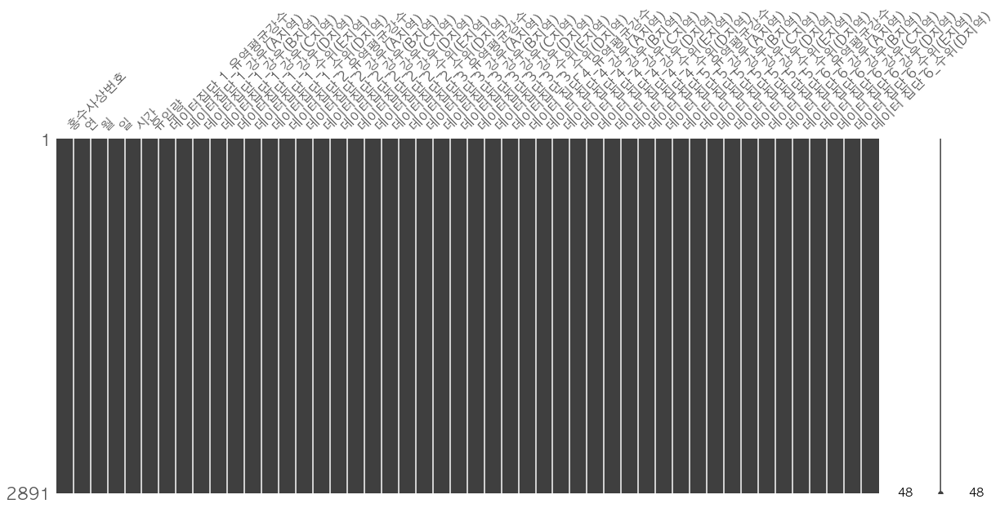

In [17]:
# 결측치 확인 그래프

import missingno as msno
msno.matrix(df, figsize=(20,8))

<br>
<br>

In [18]:
df['유입량'].describe()

# 평균이 약 1747인데 중앙값은 약 1066 정도
# 상위 75%까지의 강수량이 약 2213인데, max는 약 21504
# 어느 시점에 마구 쏟아지는 것 같은 분포(장마철)

count     2891.000000
mean      1746.902717
std       2181.790290
min          3.541153
25%        384.762514
50%       1065.549253
75%       2213.014288
max      21504.402260
Name: 유입량, dtype: float64

<br>

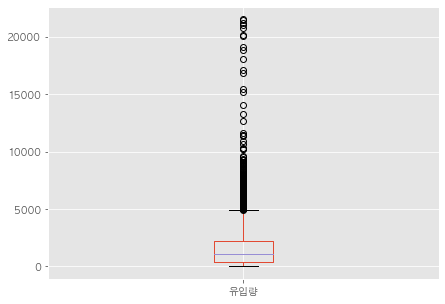

In [19]:
plt.figure(figsize=(7,5))
pd.DataFrame(df['유입량']).boxplot(column=['유입량'])
plt.show()
# 유입량이 극단적으로 많은 이상치가 많이 존재

In [173]:
# 이상치 개수 확인
IQR = df['유입량'].quantile(0.75) - df['유입량'].quantile(0.25)
max_value = df['유입량'].quantile(0.75) + 1.5*IQR
min_value = df['유입량'].quantile(0.25) - 1.5*IQR
if min_value <= 0: min_value = 0

print(max_value)
print(min_value)

4955.391948050001
0


In [174]:
outliers = (df['유입량'] > max_value).sum(axis=0)
print(outliers) # 204개의 이상치 존재

204


In [422]:
cnts = df['홍수사상번호'].value_counts()
tmp = pd.Series([0], index=[0])
cnts = cnts.append(tmp)
cnts = cnts.sort_index().cumsum()


In [406]:
# 홍수사상번호 별로 구간을 나누어 이상치 구하기

s = 0  # 이상치 총 개수

for i in range(1,26):
    IQR = df['유입량'][cnts[i-1]:cnts[i]].quantile(0.75) - df['유입량'][cnts[i-1]:cnts[i]].quantile(0.25)
    max_value = df['유입량'][cnts[i-1]:cnts[i]].quantile(0.75) + 1.5*IQR
    min_value = df['유입량'][cnts[i-1]:cnts[i]].quantile(0.25) - 1.5*IQR
    if min_value <= 0: min_value = 0
    
    isOutlier = df['유입량'][cnts[i-1]:cnts[i]] > max_value
    outliers = isOutlier.sum(axis=0)
    s += outliers
    
    # 이상치가 존재하면 출력
    if(outliers > 0):
        print("홍수사상번호 "+str(i)+"번의 이상치 개수:", outliers)

print("\n총 개수:",s)

홍수사상번호 1번의 이상치 개수: 21
홍수사상번호 12번의 이상치 개수: 10
홍수사상번호 15번의 이상치 개수: 16
홍수사상번호 16번의 이상치 개수: 32
홍수사상번호 20번의 이상치 개수: 23
홍수사상번호 22번의 이상치 개수: 37

총 개수: 139


이상치 처리를 어떻게 할지 고민?

<br>
<br>
<br>

<hr>

<ipython-input-360-11a057fd08c7>:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  figure, ax = plt.subplots(1, 2, figsize=(20,4))


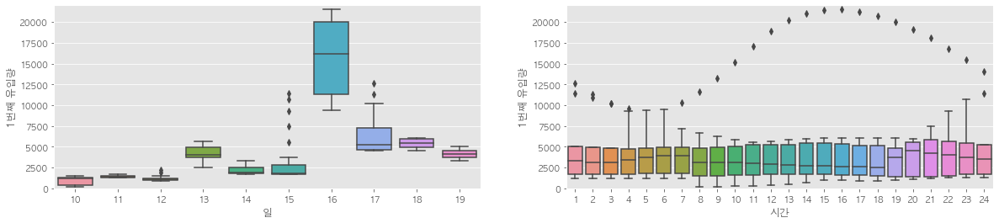

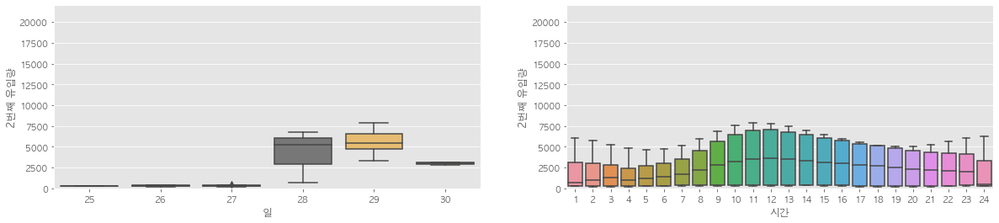

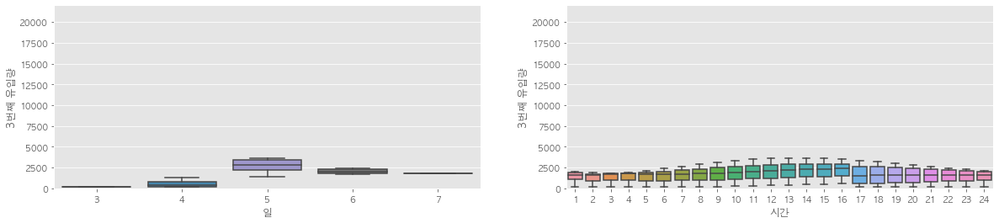

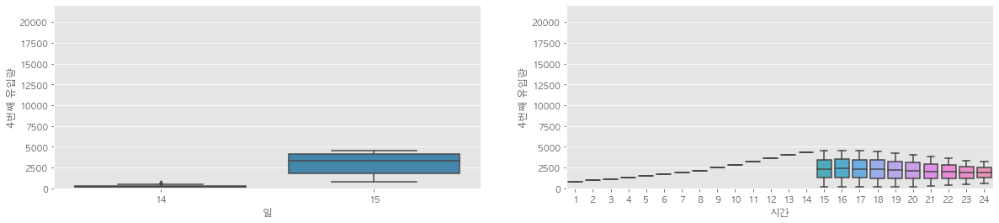

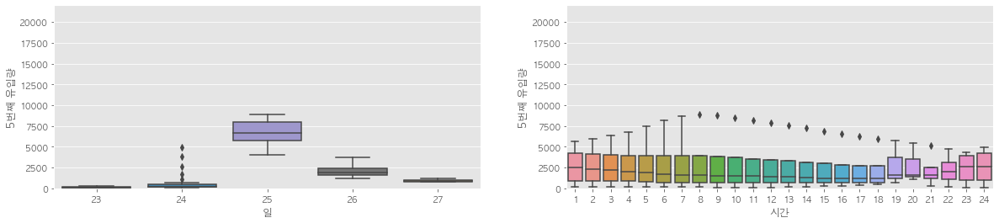

...

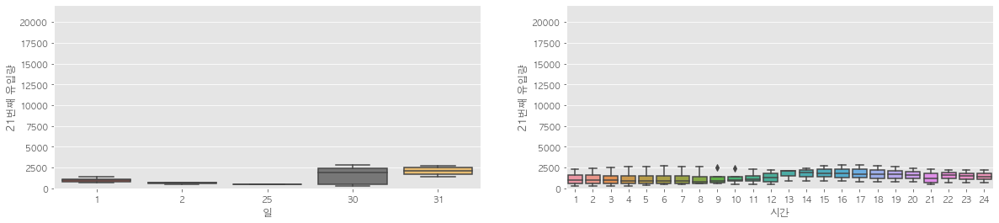

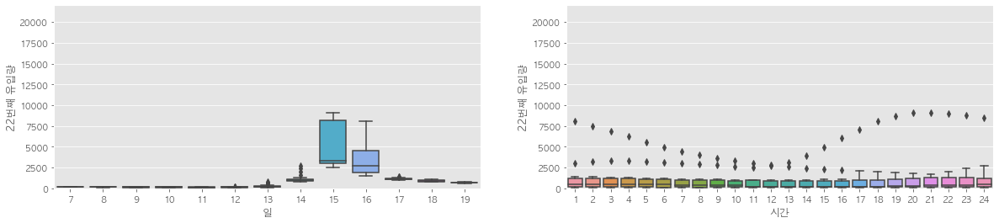

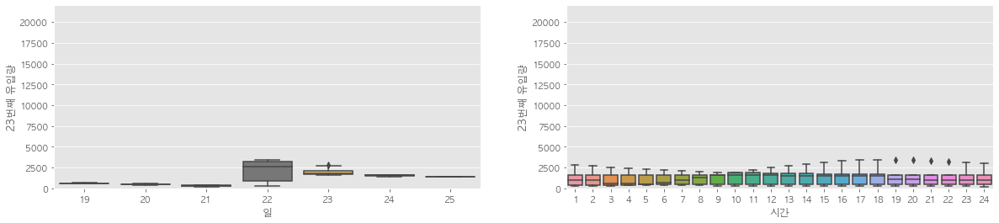

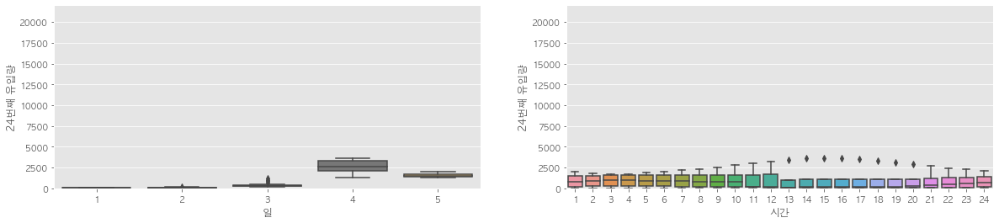

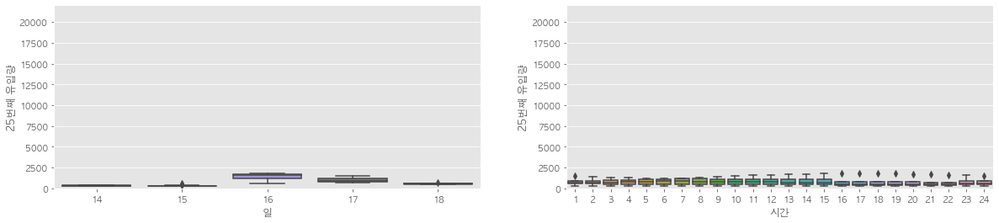

In [360]:
# 홍수사상번호마다 일별, 시간별 유입량 분포(연도별, 월별은 큰 의미가 없어 보여서 생략)

for j in range(1,26):
    df2 = df[cnts[j-1]:cnts[j]]
    figure, ax = plt.subplots(1, 2, figsize=(20,4))

    for i in range(3,5):
        plt.subplot(1,2,i-2)
        plt.ylim(0,22000)
        sns.boxplot(x=df2.iloc[:,i] , y=df2['유입량'])
        plt.ylabel(str(j)+"번째 유입량")

<br>
<br>

In [68]:
# 데이터집단 별로 그룹을 나누어 줌
dataGroup = [df.iloc[:,i:i+7] for i in range(6,48,7)]

<Figure size 1800x1440 with 0 Axes>

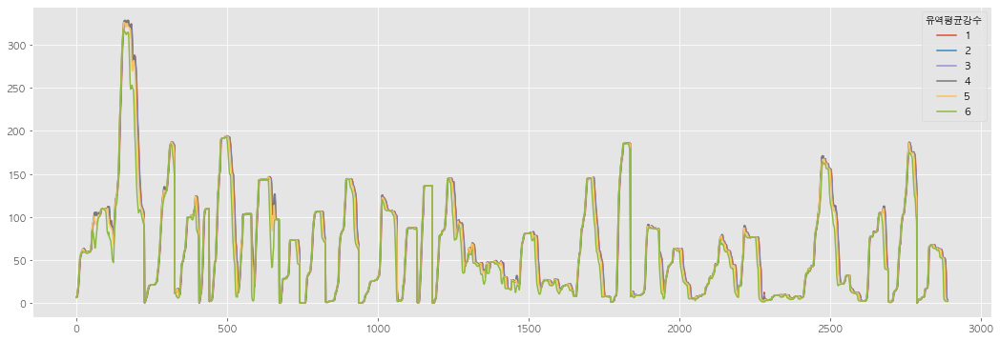

<Figure size 1800x1440 with 0 Axes>

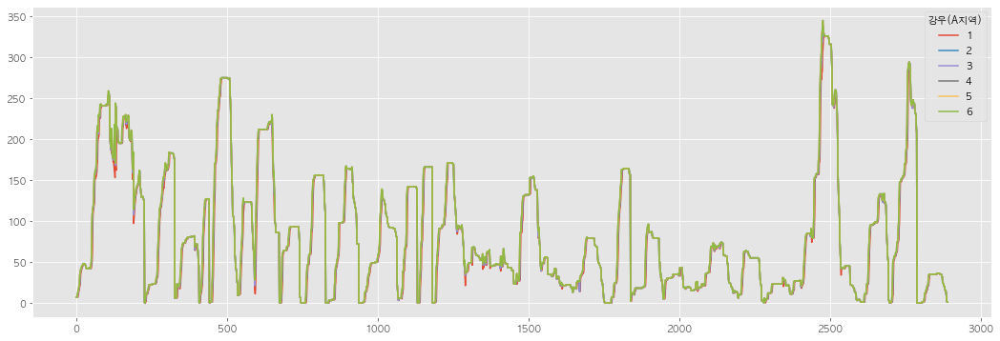

<Figure size 1800x1440 with 0 Axes>

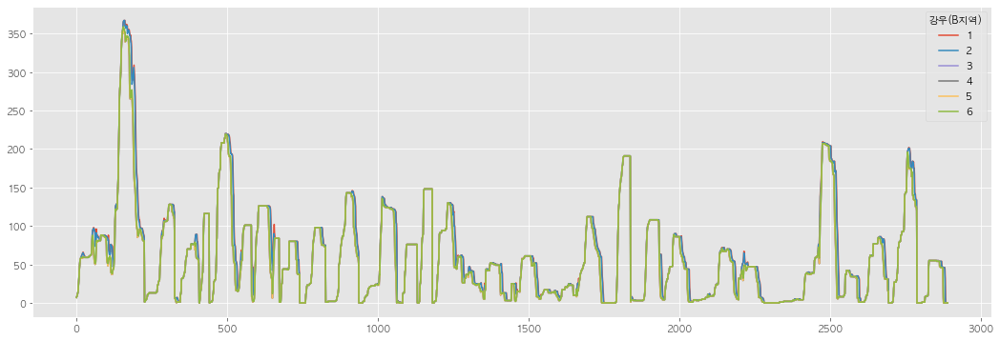

<Figure size 1800x1440 with 0 Axes>

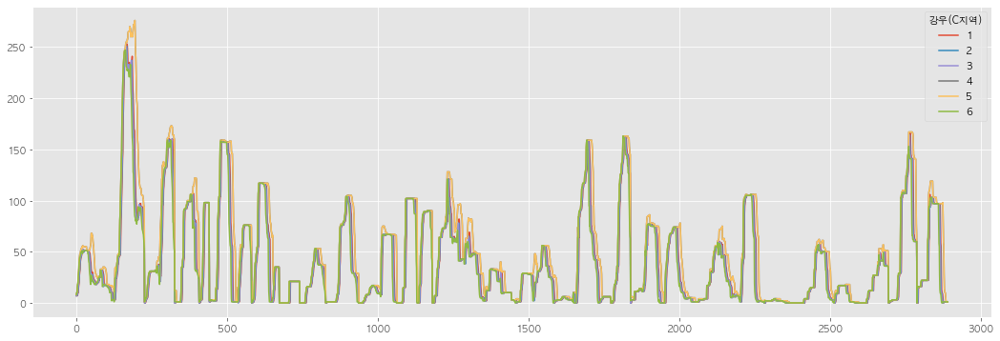

<Figure size 1800x1440 with 0 Axes>

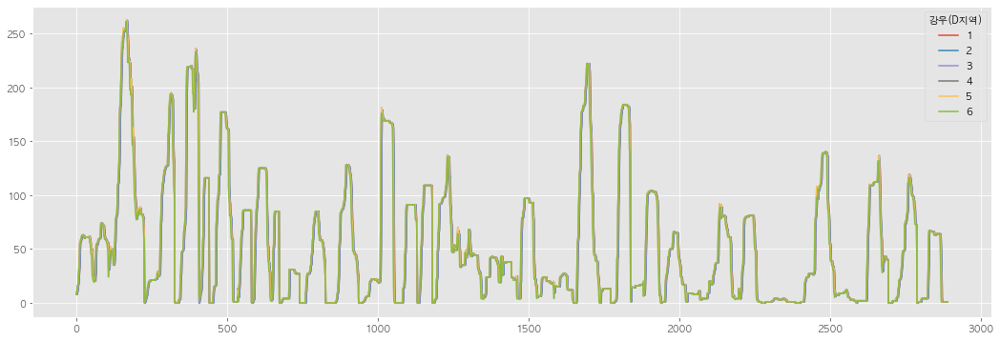

<Figure size 1800x1440 with 0 Axes>

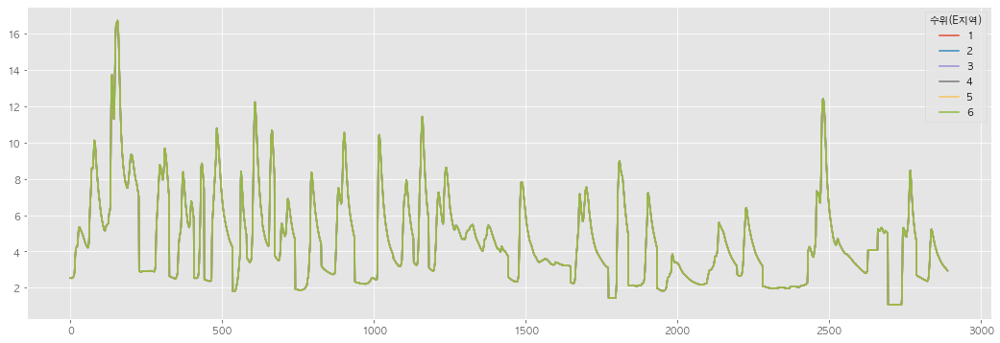

<Figure size 1800x1440 with 0 Axes>

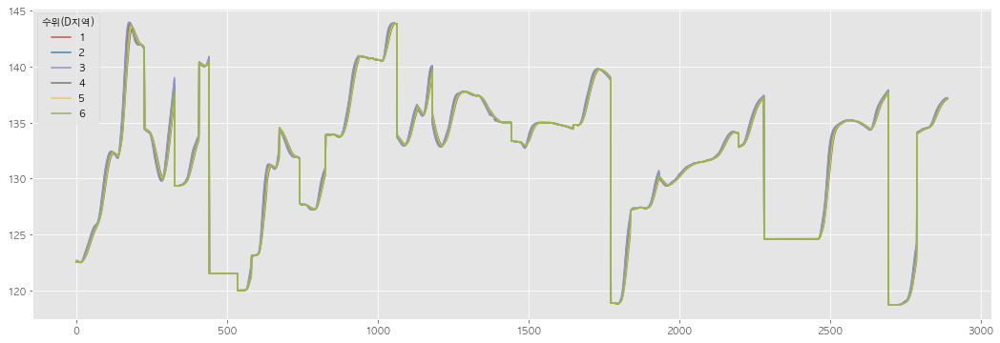

In [421]:
## 각 시간대마다 데이터 집단 간의 변수들의 값 중에 이상치를 가지는지 확인(x축은 시간 순으로 정렬된 인덱스)
variables = ['유역평균강수','강우(A지역)','강우(B지역)','강우(C지역)','강우(D지역)','수위(E지역)','수위(D지역)']

for i in range(7):
    plt.figure(figsize=(25, 20))
    data = df[variables[i]]
    data.columns = list(range(1,7))
    data.plot(figsize=(18,6))
    plt.legend(title=variables[i])
plt.show()

**7개의 변수 모두 6개의 데이터 집단 내에서 비슷한 값을 가짐.**

<br>
<br>

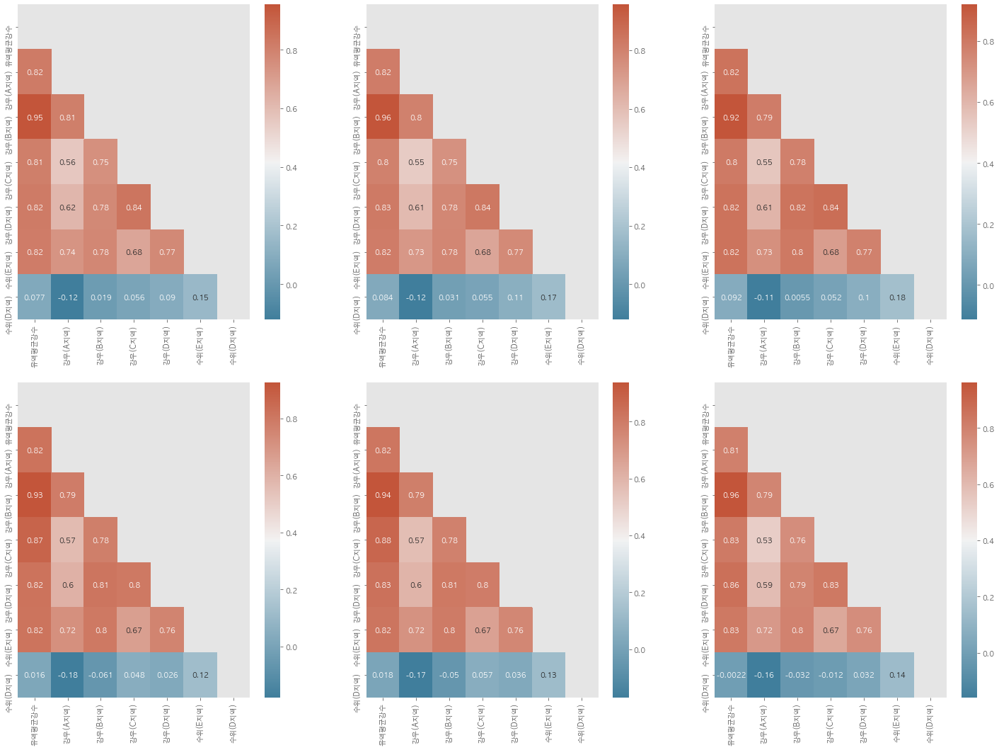

In [373]:
# 6개의 데이터 집단에서 독립변수 간의 상관관계 heatmap, lagging 적용 X

fig, ax = plt.subplots(2,3, figsize=(25,18))

for i in range(6):
    plt.subplot(2,3,i+1)
    corr = dataGroup[i].corr()
    mask = np.triu(np.ones_like(corr, dtype=bool))

    cmap = sns.diverging_palette(230, 20, as_cmap=True)

    sns.heatmap(corr, annot=True, mask=mask, cmap=cmap)

<ul>
    <li>강우(B지역)과 유역평균강수 간의 관계가 높음</li>
    <li>수위(D지역)은 다른 변수와 큰 관계가 없음</li>
</ul>

<br>
<br>

In [417]:
dataGroup = [df.iloc[:,i:i+7] for i in range(6,48,7)]

<ipython-input-418-e888d93ca0da>:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  figure, axes = plt.subplots(1,7,figsize=(60,5))


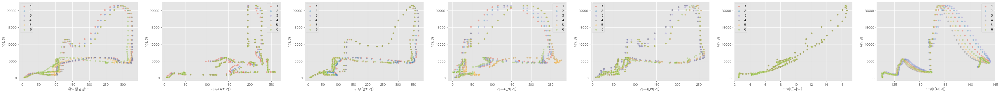

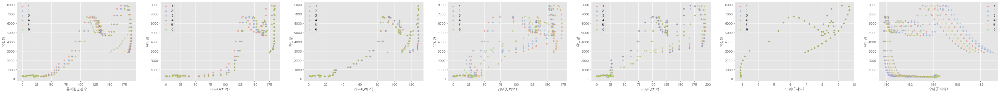

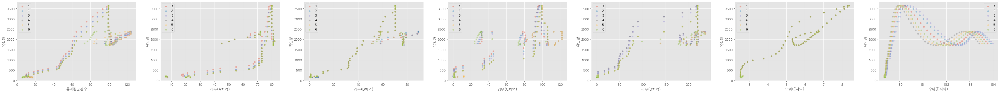

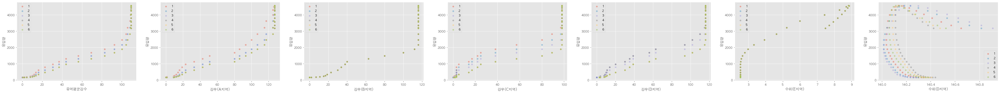

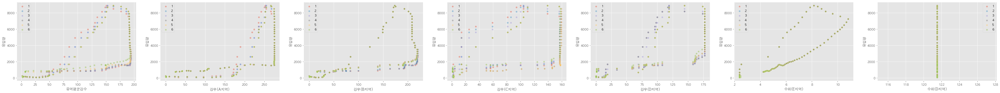

...

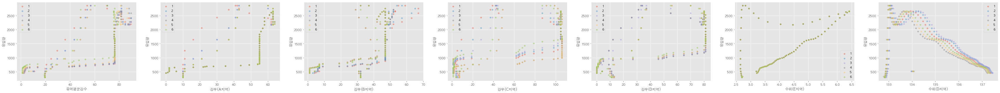

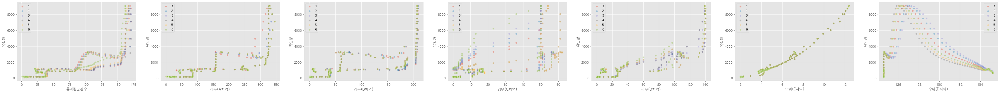

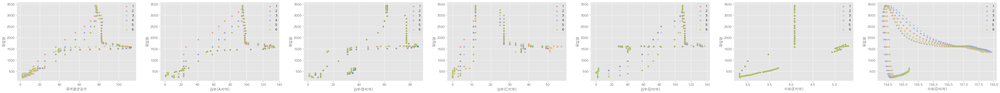

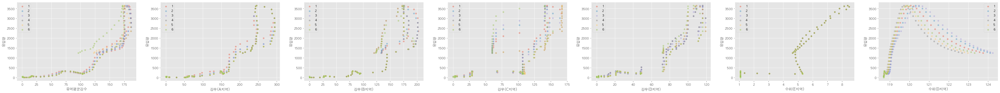

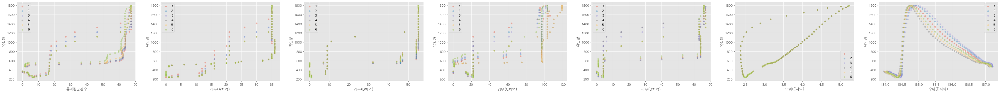

In [418]:
# 25 * 7
# 각 행이 홍수사상번호, 각 열이 데이터 집단의 7가지 변수

for k in range(1,26):
    figure, axes = plt.subplots(1,7,figsize=(60,5))
    for i in range(7):
        for j in range(6):
            temp = dataGroup[j][cnts[k-1]:cnts[k]]
            sns.scatterplot(x=temp.iloc[:,i], y=df['유입량'][cnts[k-1]:cnts[k]], alpha=0.4,
                            label=j+1, ax=axes[i])
        axes[i].set_xlabel(dataGroup[0].columns[i].split('_')[1])
        axes[i].legend()
        axes[i].set_ylabel("유입량")
plt.show()

**수위(D지역)을 제외하고는 대부분 유입량과 양의 관계를 가진다.**

**lagging을 적용할 때보다 양/음의 관계가 뚜렷한 것 같은 느낌**

<br>
<br>
<br>
<br>


**lagging 적용하기**

In [271]:
# 홍수사상번호 별로 lagging 적용

floods={}
df2 = df.copy()
tmp = df2.iloc[:,6:]

In [288]:
display(tmp)

,데이터집단 1_유역평균강수,데이터집단 1_강우(A지역),데이터집단 1_강우(B지역),데이터집단 1_강우(C지역),데이터집단 1_강우(D지역),데이터집단 1_수위(E지역),데이터집단 1_수위(D지역),데이터집단 2_유역평균강수,데이터집단 2_강우(A지역),데이터집단 2_강우(B지역),...,데이터 집단 5_강우(D지역),데이터 집단 5_수위(E지역),데이터 집단 5_수위(D지역),데이터 집단 6_유역평균강수,데이터 집단 6_강우(A지역),데이터 집단 6_강우(B지역),데이터 집단 6_강우(C지역),데이터 집단 6_강우(D지역),데이터 집단 6_수위(E지역),데이터 집단 6_수위(D지역)
0,6.4000,7,7,7,8,2.54,122.56875,6.3000,7,7,...,8,2.54,122.660,6.4000,7,7,8,8,2.54,122.610
1,6.3000,7,8,7,8,2.53,122.56250,6.4000,7,8,...,10,2.53,122.648,7.3000,7,8,10,10,2.53,122.600
2,6.4000,7,9,7,8,2.53,122.55625,7.3000,7,9,...,11,2.53,122.636,8.2000,7,9,10,11,2.53,122.590
3,7.3000,7,10,7,8,2.53,122.55625,8.2000,7,10,...,14,2.53,122.620,11.3000,9,10,15,14,2.53,122.585
4,8.2000,7,12,8,10,2.53,122.55625,11.3000,9,12,...,16,2.53,122.604,14.4000,12,12,18,16,2.53,122.575
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2886,22.7836,6,0,1,1,3.03,137.16875,8.2586,6,0,...,1,3.03,137.088,1.7366,6,0,1,1,3.03,137.130
2887,8.2586,2,0,1,1,3.00,137.18125,4.1089,2,0,...,1,3.00,137.104,1.7366,2,0,1,1,3.00,137.145
2888,4.1089,1,0,1,1,2.98,137.18750,3.3854,1,0,...,1,2.98,137.120,1.7366,1,0,1,1,2.98,137.155
2889,3.3854,1,0,1,1,2.96,137.19375,3.2841,1,0,...,1,2.96,137.136,1.7366,1,0,1,1,2.96,137.165


In [274]:
'''홍수사상번호 별로 lagging 적용하기'''
for i in range(1,26):
    floods[i] = tmp[cnts[i-1]:cnts[i]]
    st += nums[i]

In [275]:
for i in range(1,26):
    floods[i] = floods[i].shift(1)

In [276]:
shifted = pd.concat([floods[1],floods[2]])

In [277]:
for i in range(3,26):
    shifted = pd.concat([shifted,floods[i]])

In [278]:
'''lagging 적용 Dataframe'''
display(shifted)

,데이터집단 1_유역평균강수,데이터집단 1_강우(A지역),데이터집단 1_강우(B지역),데이터집단 1_강우(C지역),데이터집단 1_강우(D지역),데이터집단 1_수위(E지역),데이터집단 1_수위(D지역),데이터집단 2_유역평균강수,데이터집단 2_강우(A지역),데이터집단 2_강우(B지역),...,데이터 집단 5_강우(D지역),데이터 집단 5_수위(E지역),데이터 집단 5_수위(D지역),데이터 집단 6_유역평균강수,데이터 집단 6_강우(A지역),데이터 집단 6_강우(B지역),데이터 집단 6_강우(C지역),데이터 집단 6_강우(D지역),데이터 집단 6_수위(E지역),데이터 집단 6_수위(D지역)
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,6.4000,7.0,7.0,7.0,8.0,2.54,122.56875,6.3000,7.0,7.0,...,8.0,2.54,122.660,6.4000,7.0,7.0,8.0,8.0,2.54,122.610
2,6.3000,7.0,8.0,7.0,8.0,2.53,122.56250,6.4000,7.0,8.0,...,10.0,2.53,122.648,7.3000,7.0,8.0,10.0,10.0,2.53,122.600
3,6.4000,7.0,9.0,7.0,8.0,2.53,122.55625,7.3000,7.0,9.0,...,11.0,2.53,122.636,8.2000,7.0,9.0,10.0,11.0,2.53,122.590
4,7.3000,7.0,10.0,7.0,8.0,2.53,122.55625,8.2000,7.0,10.0,...,14.0,2.53,122.620,11.3000,9.0,10.0,15.0,14.0,2.53,122.585
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2886,36.5129,10.0,0.0,1.0,1.0,3.05,137.15625,22.7836,10.0,0.0,...,1.0,3.05,137.072,1.7908,10.0,0.0,1.0,1.0,3.05,137.115
2887,22.7836,6.0,0.0,1.0,1.0,3.03,137.16875,8.2586,6.0,0.0,...,1.0,3.03,137.088,1.7366,6.0,0.0,1.0,1.0,3.03,137.130
2888,8.2586,2.0,0.0,1.0,1.0,3.00,137.18125,4.1089,2.0,0.0,...,1.0,3.00,137.104,1.7366,2.0,0.0,1.0,1.0,3.00,137.145
2889,4.1089,1.0,0.0,1.0,1.0,2.98,137.18750,3.3854,1.0,0.0,...,1.0,2.98,137.120,1.7366,1.0,0.0,1.0,1.0,2.98,137.155


In [279]:
shifted = pd.concat([df2.iloc[:,:6], shifted], axis=1)

In [281]:
shifted.head()  # lagging 적용 완료

,홍수사상번호,연,월,일,시간,유입량,데이터집단 1_유역평균강수,데이터집단 1_강우(A지역),데이터집단 1_강우(B지역),데이터집단 1_강우(C지역),...,데이터 집단 5_강우(D지역),데이터 집단 5_수위(E지역),데이터 집단 5_수위(D지역),데이터 집단 6_유역평균강수,데이터 집단 6_강우(A지역),데이터 집단 6_강우(B지역),데이터 집단 6_강우(C지역),데이터 집단 6_강우(D지역),데이터 집단 6_수위(E지역),데이터 집단 6_수위(D지역)
0,1,2006,7,10,8,189.100000,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,2006,7,10,9,216.951962,6.4,7.0,7.0,7.0,...,8.0,2.54,122.660,6.4,7.0,7.0,8.0,8.0,2.54,122.610
2,1,2006,7,10,10,251.424419,6.3,7.0,8.0,7.0,...,10.0,2.53,122.648,7.3,7.0,8.0,10.0,10.0,2.53,122.600
3,1,2006,7,10,11,302.812199,6.4,7.0,9.0,7.0,...,11.0,2.53,122.636,8.2,7.0,9.0,10.0,11.0,2.53,122.590
4,1,2006,7,10,12,384.783406,7.3,7.0,10.0,7.0,...,14.0,2.53,122.620,11.3,9.0,10.0,15.0,14.0,2.53,122.585


In [282]:
# 데이터집단 별로 그룹 나누기

dataGroup2 = [shifted.iloc[:,i:i+7] for i in range(6,48,7)]

<ipython-input-284-5713fd9afba0>:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  figure, axes = plt.subplots(1,7,figsize=(60,5))


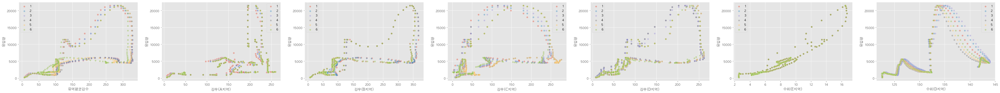

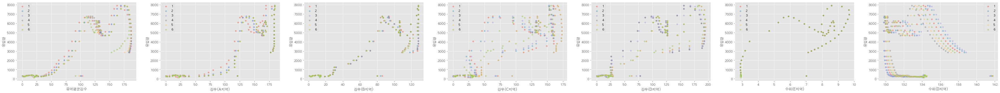

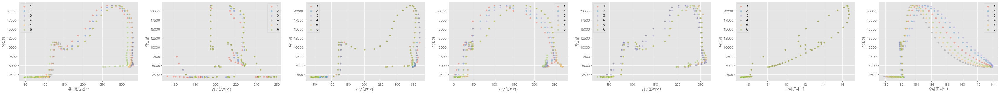

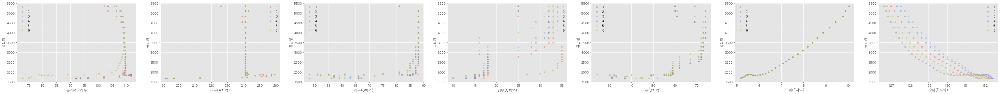

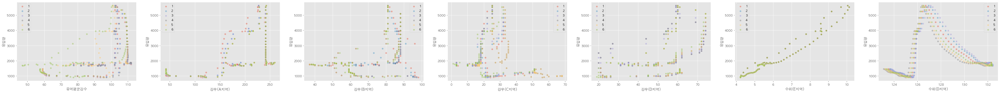

...

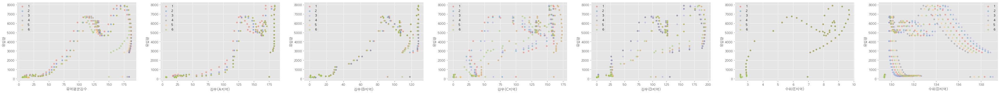

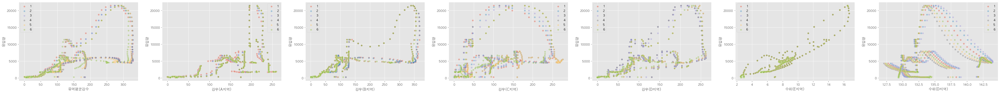

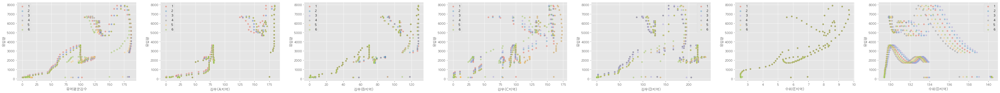

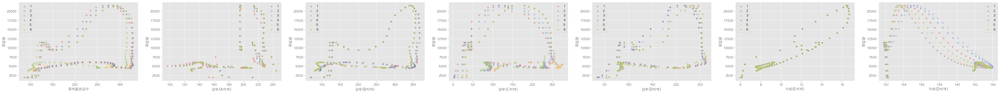

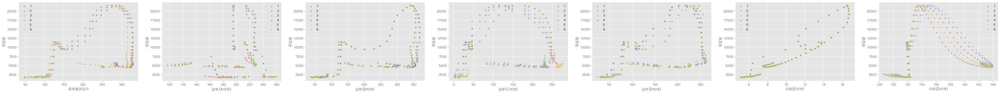

In [284]:
# 각 행이 홍수사상번호 순, 각 열이 변수 순, lagging 적용

for k in range(1,26):
    figure, axes = plt.subplots(1,7,figsize=(60,5))
    for i in range(7):
        for j in range(6):
            temp = dataGroup[j][cnts[k-1]:cnts[k]]
            sns.scatterplot(x=temp.iloc[:,i], y=df['유입량'][cnts[k-1]:cnts[k]], alpha=0.4,
                            label=j+1, ax=axes[i])
        axes[i].set_xlabel(dataGroup2[0].columns[i].split('_')[1])
        axes[i].legend()
        axes[i].set_ylabel("유입량")
plt.show()

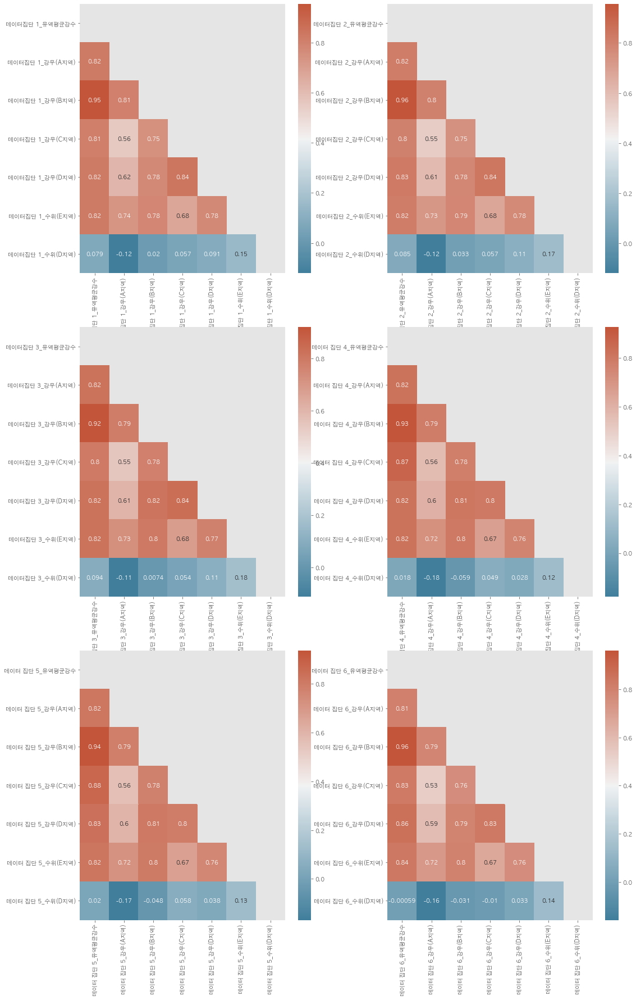

In [285]:
# lagging 적용 후 변수 간 상관관계 heatmap(사상 번호 구별 X)

fig, ax = plt.subplots(3,2, figsize=(18,30))

for i in range(6):
    plt.subplot(3,2,i+1)
    corr = dataGroup2[i].corr()
    mask = np.triu(np.ones_like(corr, dtype=bool))

    cmap = sns.diverging_palette(230, 20, as_cmap=True)

    sns.heatmap(corr, annot=True, mask=mask, cmap=cmap)

In [328]:
#import pandas
import statsmodels.api as sm
from statsmodels.formula.api import ols

In [365]:
# 데이터집단 1, 홍수사상번호 순, lagging 적용
# ols 

models = []

for i in range(1,26):
    data = shifted.iloc[cnts[i-1]:cnts[i], 5:13][1:]
    data.columns = ['target', 'avg', 'A', 'B', 'C', 'D', 'E2', 'D2']
    model = ols('target ~ avg + A + B + C + D + E2 + D2', data=data).fit()
    models.append(model)

In [366]:
for i in range(25):
    print(models[i].params.round(2))

Intercept   -9310.29
avg            -4.23
A             -19.00
B              22.04
C             -46.41
D              28.18
E2           1115.61
D2             49.35
dtype: float64
Intercept    24815.41
avg            -68.30
A               -5.85
B              109.44
C              -20.73
D               26.37
E2             540.74
D2            -195.45
dtype: float64
Intercept    27263.11
avg             13.99
A               -1.08
B               15.99
C                1.02
D               -9.08
E2             554.58
D2            -221.86
dtype: float64
Intercept    366346.81
avg              29.97
A                 6.97
B               -12.45
C                 5.16
D                -9.46
E2              288.29
D2            -2615.18
dtype: float64
Intercept      -0.26
avg           -72.88
A              24.60
B              43.03
C             -12.26
D             -30.43
E2           1576.85
D2            -32.07
dtype: float64
Intercept    64764.42
avg            -10.37
A        

<hr>